# Data Analysis
## Class 24
### Features in the flight dataset
#### December 4th

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('flightsOct.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 486165 entries, 0 to 486164
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   YEAR                 486165 non-null  int64  
 1   MONTH                486165 non-null  int64  
 2   DAY_OF_MONTH         486165 non-null  int64  
 3   OP_CARRIER           486165 non-null  object 
 4   TAIL_NUM             485811 non-null  object 
 5   OP_CARRIER_FL_NUM    486165 non-null  int64  
 6   ORIGIN               486165 non-null  object 
 7   DEST                 486165 non-null  object 
 8   CRS_DEP_TIME         486165 non-null  int64  
 9   DEP_TIME             483826 non-null  float64
 10  DEP_DELAY            483826 non-null  float64
 11  TAXI_OUT             483730 non-null  float64
 12  TAXI_IN              483594 non-null  float64
 13  CRS_ARR_TIME         486165 non-null  int64  
 14  ARR_TIME             483594 non-null  float64
 15  ARR_DELAY        

<AxesSubplot: xlabel='DAY_OF_MONTH', ylabel='Count'>

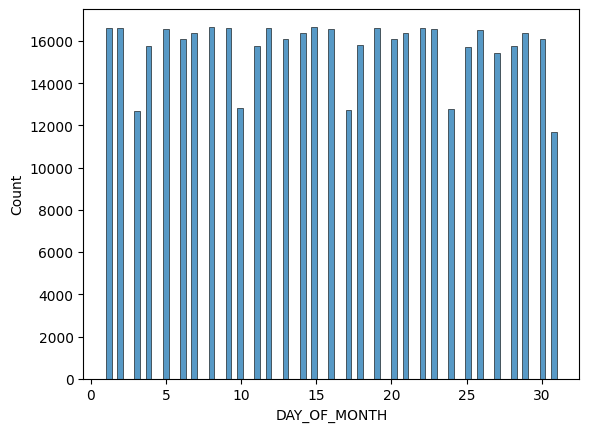

In [4]:
sns.histplot(df.DAY_OF_MONTH)

In [5]:
day3 = df[df.DAY_OF_MONTH == 3]

<AxesSubplot: >

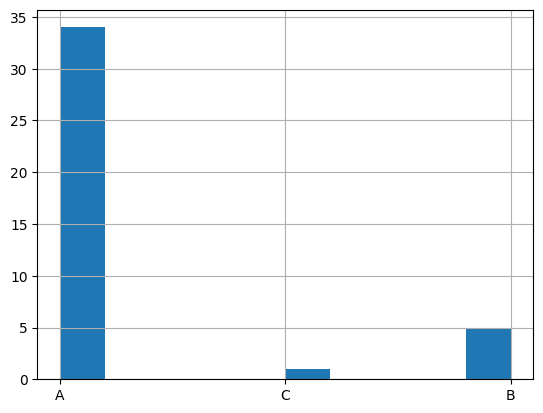

In [6]:
day3[day3.CANCELLED == 1].CANCELLATION_CODE.hist()

* A = Airline Cancellation
* B = Weather Cancellation
* C = National Air System Cancellation
* D = Security Cancellation

In [7]:
df[df.CANCELLATION_CODE == 'C'].DAY_OF_MONTH

8517      31
11180     30
14737     28
17427      9
28142     10
          ..
480621    31
480749    31
484061    30
484364    30
484939    31
Name: DAY_OF_MONTH, Length: 524, dtype: int64

In [8]:
df.ARR_DELAY.describe()

count    482878.000000
mean         -0.780390
std          32.724983
min         -81.000000
25%         -14.000000
50%          -7.000000
75%           3.000000
max        1555.000000
Name: ARR_DELAY, dtype: float64

In [9]:
cat = pd.cut(df.ARR_DELAY, bins=2, labels=np.arange(2))
cat

0         0
1         0
2         0
3         0
4         0
         ..
486160    0
486161    0
486162    0
486163    0
486164    0
Name: ARR_DELAY, Length: 486165, dtype: category
Categories (2, int64): [0 < 1]

<AxesSubplot: >

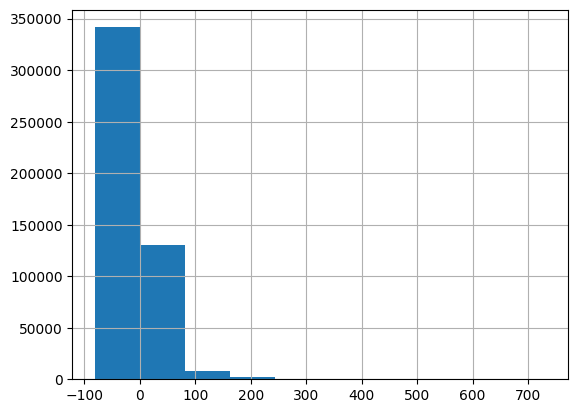

In [10]:
df[cat == 0].ARR_DELAY.hist()

<AxesSubplot: >

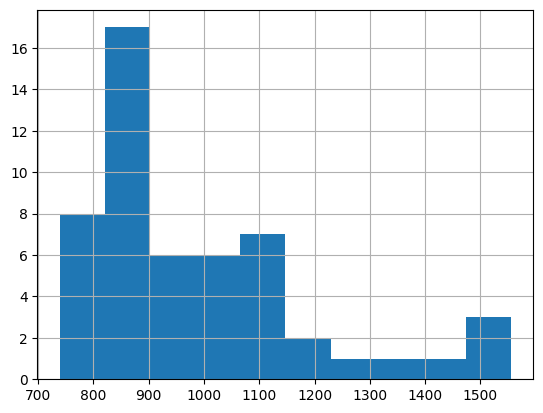

In [11]:
df[cat == 1].ARR_DELAY.hist()

In [12]:
cat2 = pd.cut(df.ARR_DELAY, bins=[-np.inf, 5., 45., np.inf], labels=['Low', 'Medium', 'Large'])

np.inf == float("-inf")

In [13]:
pd.cut(df.ARR_DELAY, bins=[float("-inf"), 5., 45., np.inf], labels=['Low', 'Medium', 'Large'])

0          Large
1            Low
2            Low
3            Low
4            Low
           ...  
486160       Low
486161       Low
486162    Medium
486163    Medium
486164       Low
Name: ARR_DELAY, Length: 486165, dtype: category
Categories (3, object): ['Low' < 'Medium' < 'Large']

<AxesSubplot: >

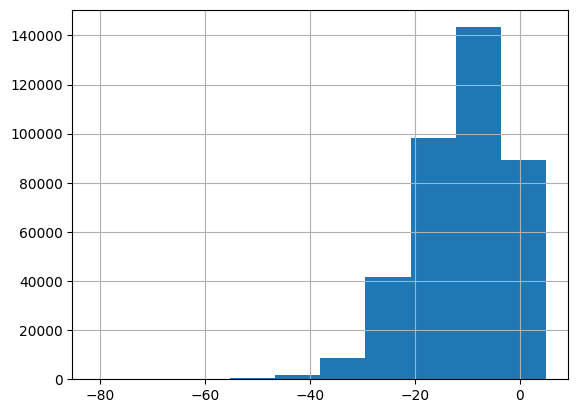

In [14]:
df[cat2 == 'Low'].ARR_DELAY.hist()

<AxesSubplot: >

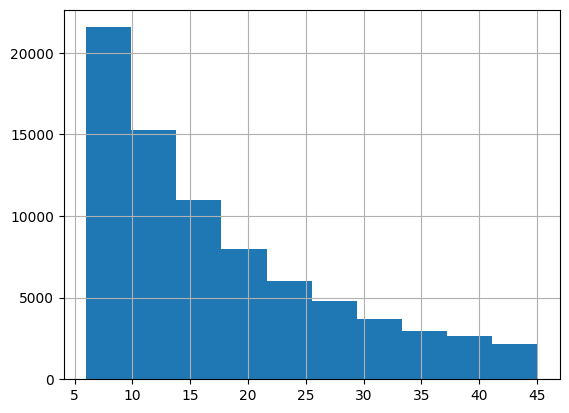

In [15]:
df[cat2 == 'Medium'].ARR_DELAY.hist()

<AxesSubplot: >

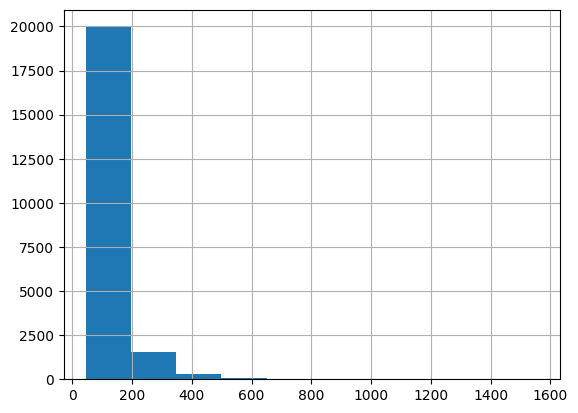

In [16]:
df[cat2 == 'Large'].ARR_DELAY.hist()

In [17]:
df['DELAYED'] = pd.cut(df.ARR_DELAY, bins=[-np.inf, 45., np.inf], labels=['On time', 'Delayed'])

In [18]:
df.DELAYED.info()

<class 'pandas.core.series.Series'>
RangeIndex: 486165 entries, 0 to 486164
Series name: DELAYED
Non-Null Count   Dtype   
--------------   -----   
482878 non-null  category
dtypes: category(1)
memory usage: 475.0 KB


In [19]:
g1 = df.groupby(['DAY_OF_MONTH', 'DELAYED'])

In [20]:
pd.isnull(g1.get_group((1, "Delayed")).DELAYED).sum()

0

In [41]:
g1.get_group((1,'Delayed'))

,YEAR,MONTH,DAY_OF_MONTH,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,...,ARR_DELAY,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,Unnamed: 23,DELAYED
0,2015,10,1,AA,N797AA,1,JFK,LAX,900,1001.0,...,51.0,0.0,NaN,0.0,370.0,360.0,324.0,2475.0,NaN,Delayed
371,2015,10,1,AA,N793AA,16,SFO,JFK,1240,1426.0,...,129.0,0.0,NaN,0.0,345.0,368.0,319.0,2586.0,NaN,Delayed
689,2015,10,1,AA,N3LHAA,26,ORD,BOS,1510,1712.0,...,120.0,0.0,NaN,0.0,147.0,145.0,115.0,867.0,NaN,Delayed
846,2015,10,1,AA,N796AA,32,LAX,JFK,1400,1522.0,...,62.0,0.0,NaN,0.0,334.0,314.0,289.0,2475.0,NaN,Delayed
1656,2015,10,1,AA,N3LHAA,40,BOS,ORD,1930,2125.0,...,113.0,0.0,NaN,0.0,161.0,159.0,134.0,867.0,NaN,Delayed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
383741,2015,10,1,WN,N7827A,1388,SNA,OAK,1900,2045.0,...,100.0,0.0,NaN,0.0,80.0,75.0,62.0,371.0,NaN,Delayed
383759,2015,10,1,WN,N273WN,210,SNA,SFO,1110,1213.0,...,77.0,0.0,NaN,0.0,85.0,99.0,82.0,372.0,NaN,Delayed
383769,2015,10,1,WN,N239WN,2187,SNA,SJC,1430,1537.0,...,65.0,0.0,NaN,0.0,70.0,68.0,59.0,342.0,NaN,Delayed
386542,2015,10,1,OO,N926SW,5549,SFO,ACV,820,923.0,...,54.0,0.0,NaN,0.0,72.0,63.0,37.0,250.0,NaN,Delayed


hacer histograma de dias dividiento entre delayed (con hue)

<AxesSubplot: xlabel='DAY_OF_MONTH', ylabel='Count'>

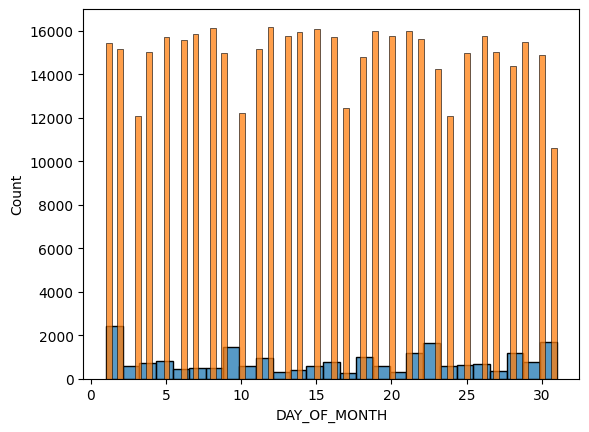

In [43]:
sns.histplot(df.groupby('DELAYED').get_group('Delayed').DAY_OF_MONTH)
sns.histplot(df.groupby('DELAYED').get_group('On time').DAY_OF_MONTH)

In [21]:
origen = df.groupby(['ORIGIN'])

In [22]:
origen.groups.keys()

dict_keys(['ABE', 'ABI', 'ABQ', 'ABR', 'ABY', 'ACK', 'ACT', 'ACV', 'ACY', 'ADK', 'ADQ', 'AEX', 'AGS', 'ALB', 'ALO', 'AMA', 'ANC', 'APN', 'ASE', 'ATL', 'ATW', 'AUS', 'AVL', 'AVP', 'AZO', 'BDL', 'BET', 'BFL', 'BGM', 'BGR', 'BHM', 'BIL', 'BIS', 'BJI', 'BMI', 'BNA', 'BOI', 'BOS', 'BPT', 'BQK', 'BQN', 'BRD', 'BRO', 'BRW', 'BTM', 'BTR', 'BTV', 'BUF', 'BUR', 'BWI', 'BZN', 'CAE', 'CAK', 'CDC', 'CDV', 'CHA', 'CHO', 'CHS', 'CID', 'CIU', 'CLE', 'CLL', 'CLT', 'CMH', 'CMI', 'CMX', 'COD', 'COS', 'COU', 'CPR', 'CRP', 'CRW', 'CSG', 'CVG', 'CWA', 'DAB', 'DAL', 'DAY', 'DBQ', 'DCA', 'DEN', 'DFW', 'DHN', 'DIK', 'DLH', 'DRO', 'DSM', 'DTW', 'DVL', 'EAU', 'ECP', 'EGE', 'EKO', 'ELM', 'ELP', 'ERI', 'ESC', 'EUG', 'EVV', 'EWN', 'EWR', 'EYW', 'FAI', 'FAR', 'FAT', 'FAY', 'FCA', 'FLG', 'FLL', 'FNT', 'FSD', 'FSM', 'FWA', 'GCC', 'GCK', 'GEG', 'GFK', 'GGG', 'GJT', 'GNV', 'GPT', 'GRB', 'GRI', 'GRK', 'GRR', 'GSO', 'GSP', 'GTF', 'GTR', 'GUM', 'HDN', 'HIB', 'HLN', 'HNL', 'HOB', 'HOU', 'HPN', 'HRL', 'HSV', 'HYS', 'IAD', 'I

In [23]:
pd.read_csv('airports.csv')

,AIRPORT,DISPLAY_AIRPORT_NAME,DISPLAY_AIRPORT_CITY_NAME_FULL,LATITUDE,LONGITUDE
0,ABE,Lehigh Valley International,"Allentown/Bethlehem/Easton, PA",40.654722,-75.438333
1,ABI,Abilene Regional,"Abilene, TX",32.409444,-99.679722
2,ABQ,Albuquerque International Sunport,"Albuquerque, NM",35.041667,-106.606389
3,ABR,Aberdeen Regional,"Aberdeen, SD",45.449722,-98.421667
4,ABY,Southwest Georgia Regional,"Albany, GA",31.532222,-84.196111
...,...,...,...,...,...
317,AKN,King Salmon Airport,"King Salmon, AK",58.677778,-156.651667
318,DLG,Dillingham Airport,"Dillingham, AK",59.041667,-158.506667
319,GST,Gustavus Airport,"Gustavus, AK",58.427500,-135.705000
320,HYA,Barnstable Municipal-Boardman/Polando Field,"Hyannis, MA",41.665833,-70.280556


In [24]:
origen['TAXI_OUT'].median()

ORIGIN
ABE    11.0
ABI     8.0
ABQ    10.0
ABR    13.5
ABY    12.0
       ... 
VPS    13.0
WRG     5.0
XNA    12.0
YAK     6.0
YUM    13.0
Name: TAXI_OUT, Length: 306, dtype: float64

agrupar por origen y ver como se distribuye el tiempo de vuelo para cada origen

In [57]:
origen['AIR_TIME'].describe()

,count,mean,std,min,25%,50%,75%,max
ORIGIN,,,,,,,,
ABE,239.0,97.979079,13.726760,68.0,85.5,102.0,107.0,130.0
ABI,192.0,34.421875,3.580655,27.0,32.0,34.0,36.0,56.0
ABQ,1805.0,98.250970,38.495135,47.0,72.0,90.0,123.0,243.0
ABR,70.0,44.457143,4.102617,37.0,42.0,43.5,47.0,59.0
ABY,86.0,34.476744,3.260194,29.0,32.0,34.0,36.0,45.0
...,...,...,...,...,...,...,...,...
VPS,407.0,71.778870,29.875773,38.0,43.0,53.0,101.0,164.0
WRG,58.0,17.017241,5.945635,7.0,11.0,19.0,21.0,30.0
XNA,932.0,80.265021,26.863772,41.0,71.0,78.0,85.0,224.0


<AxesSubplot: xlabel='TAXI_OUT', ylabel='ARR_DELAY'>

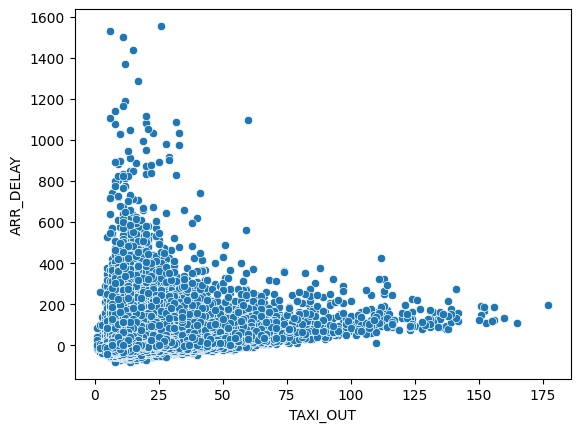

In [25]:
sns.scatterplot(y=df["ARR_DELAY"], x=df["TAXI_OUT"])

<AxesSubplot: xlabel='TAXI_IN', ylabel='ARR_DELAY'>

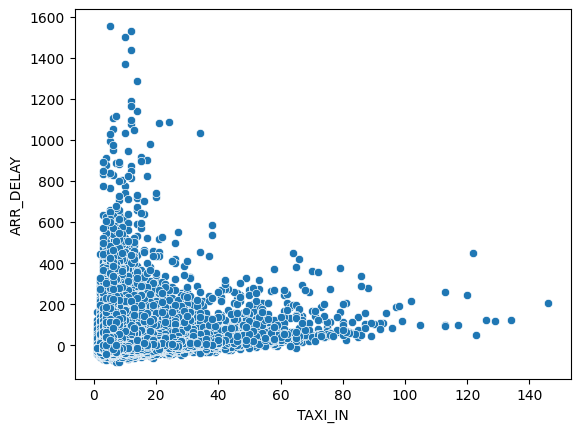

In [26]:
sns.scatterplot(y=df["ARR_DELAY"], x=df["TAXI_IN"])

In [27]:
g2 = df.groupby('DELAYED')

hacer grafica de pairwiseplote para cada grupo en g2

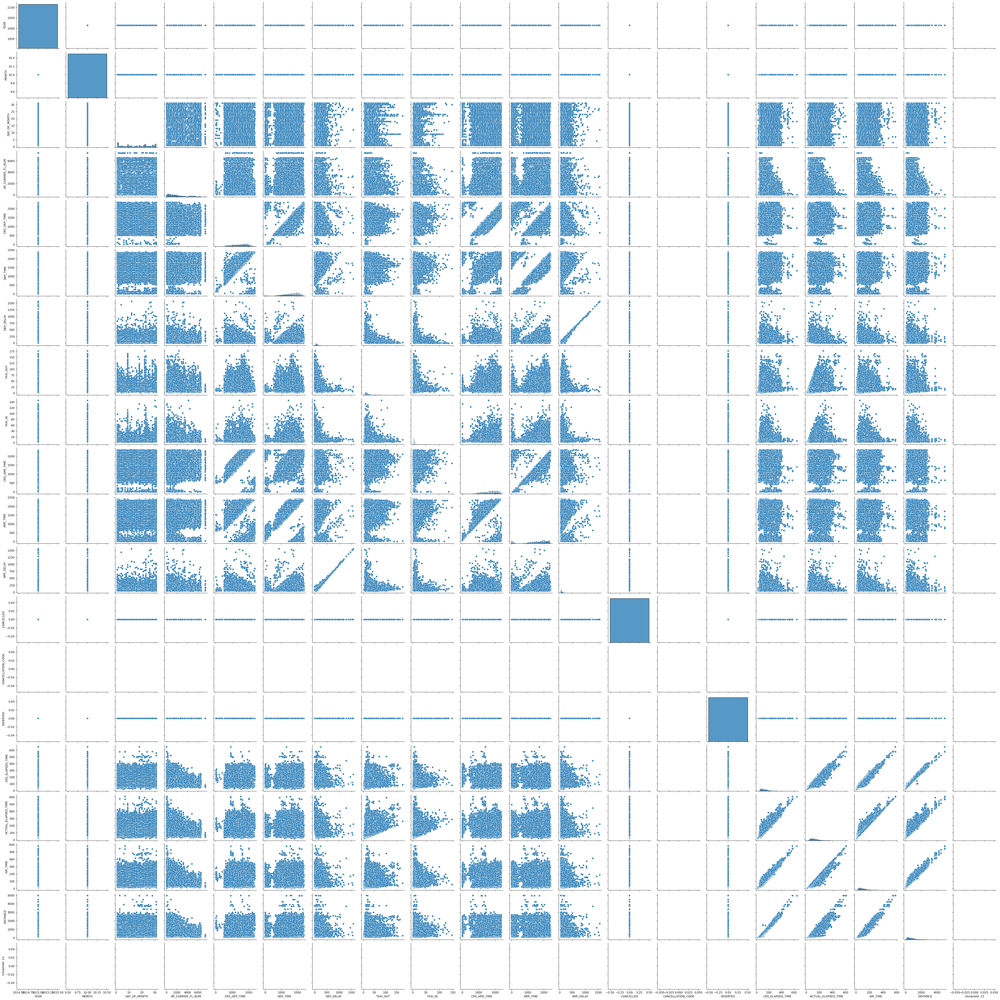

In [63]:
sns.pairplot(g2.get_group('Delayed'))

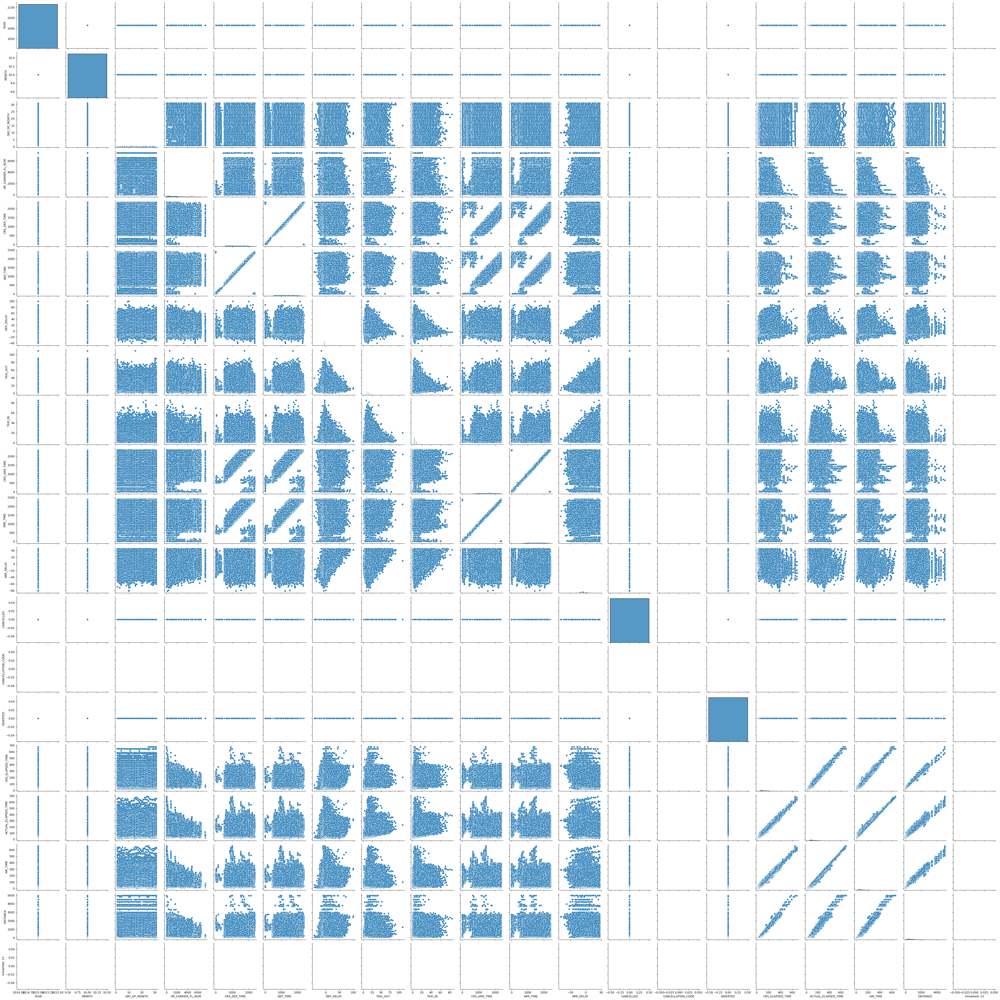

In [64]:
sns.pairplot(g2.get_group('On time'))

In [29]:
df.merge(origen['TAXI_OUT'].median(), on='ORIGIN')

,YEAR,MONTH,DAY_OF_MONTH,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,...,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,Unnamed: 23,DELAYED,TAXI_OUT_y
0,2015,10,1,AA,N797AA,1,JFK,LAX,900,1001.0,...,0.0,NaN,0.0,370.0,360.0,324.0,2475.0,NaN,Delayed,21.0
1,2015,10,2,AA,N788AA,1,JFK,LAX,900,855.0,...,0.0,NaN,0.0,370.0,360.0,328.0,2475.0,NaN,On time,21.0
2,2015,10,4,AA,N794AA,1,JFK,LAX,900,854.0,...,0.0,NaN,0.0,370.0,360.0,322.0,2475.0,NaN,On time,21.0
3,2015,10,5,AA,N798AA,1,JFK,LAX,900,859.0,...,0.0,NaN,0.0,370.0,357.0,326.0,2475.0,NaN,On time,21.0
4,2015,10,6,AA,N799AA,1,JFK,LAX,900,856.0,...,0.0,NaN,0.0,370.0,342.0,316.0,2475.0,NaN,On time,21.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486160,2015,10,31,WN,N413WN,4061,ISP,MCO,1350,1358.0,...,0.0,NaN,0.0,165.0,148.0,133.0,971.0,NaN,On time,8.0
486161,2015,10,31,WN,N7745A,4070,ISP,MCO,720,718.0,...,0.0,NaN,0.0,165.0,149.0,131.0,971.0,NaN,On time,8.0
486162,2015,10,31,WN,N926WN,3925,ISP,PBI,1605,1620.0,...,0.0,NaN,0.0,170.0,155.0,143.0,1052.0,NaN,On time,8.0
486163,2015,10,31,WN,N413WN,4062,ISP,PBI,715,718.0,...,0.0,NaN,0.0,170.0,150.0,135.0,1052.0,NaN,On time,8.0


join el describe de cada origen al df

In [30]:
origen['TAXI_OUT'].describe()

,count,mean,std,min,25%,50%,75%,max
ORIGIN,,,,,,,,
ABE,239.0,12.418410,4.539351,6.0,9.0,11.0,14.0,33.0
ABI,194.0,9.128866,4.702429,3.0,6.0,8.0,10.0,47.0
ABQ,1809.0,11.607518,5.095077,5.0,8.0,10.0,13.0,71.0
ABR,70.0,15.571429,7.942860,4.0,10.0,13.5,18.0,49.0
ABY,87.0,13.827586,6.623087,6.0,9.0,12.0,16.0,41.0
...,...,...,...,...,...,...,...,...
VPS,411.0,14.447689,5.875876,1.0,11.0,13.0,17.0,42.0
WRG,60.0,7.350000,4.620606,2.0,4.0,5.0,9.0,23.0
XNA,934.0,13.904711,6.109796,2.0,10.0,12.0,16.0,70.0


In [65]:
df.merge(origen['TAXI_OUT'].describe(), on='ORIGIN')

,YEAR,MONTH,DAY_OF_MONTH,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,...,Unnamed: 23,DELAYED,count,mean,std,min,25%,50%,75%,max
0,2015,10,1,AA,N797AA,1,JFK,LAX,900,1001.0,...,NaN,Delayed,8272.0,23.677466,11.002300,4.0,17.0,21.0,28.0,165.0
1,2015,10,2,AA,N788AA,1,JFK,LAX,900,855.0,...,NaN,On time,8272.0,23.677466,11.002300,4.0,17.0,21.0,28.0,165.0
2,2015,10,4,AA,N794AA,1,JFK,LAX,900,854.0,...,NaN,On time,8272.0,23.677466,11.002300,4.0,17.0,21.0,28.0,165.0
3,2015,10,5,AA,N798AA,1,JFK,LAX,900,859.0,...,NaN,On time,8272.0,23.677466,11.002300,4.0,17.0,21.0,28.0,165.0
4,2015,10,6,AA,N799AA,1,JFK,LAX,900,856.0,...,NaN,On time,8272.0,23.677466,11.002300,4.0,17.0,21.0,28.0,165.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486160,2015,10,31,WN,N413WN,4061,ISP,MCO,1350,1358.0,...,NaN,On time,366.0,8.762295,2.176034,5.0,7.0,8.0,10.0,20.0
486161,2015,10,31,WN,N7745A,4070,ISP,MCO,720,718.0,...,NaN,On time,366.0,8.762295,2.176034,5.0,7.0,8.0,10.0,20.0
486162,2015,10,31,WN,N926WN,3925,ISP,PBI,1605,1620.0,...,NaN,On time,366.0,8.762295,2.176034,5.0,7.0,8.0,10.0,20.0
486163,2015,10,31,WN,N413WN,4062,ISP,PBI,715,718.0,...,NaN,On time,366.0,8.762295,2.176034,5.0,7.0,8.0,10.0,20.0


<AxesSubplot: xlabel='DISTANCE', ylabel='CRS_ELAPSED_TIME'>

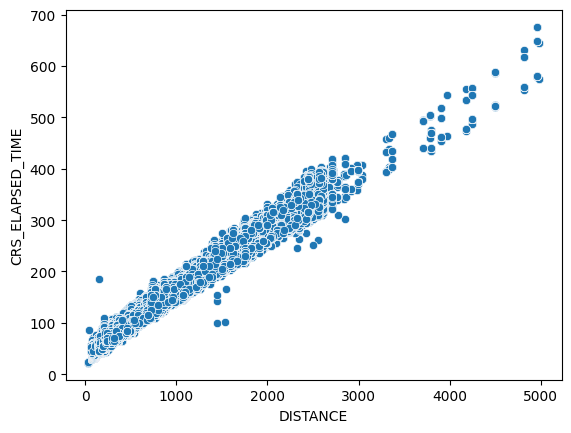

In [31]:
sns.scatterplot(y=df['CRS_ELAPSED_TIME'], x=df['DISTANCE'])

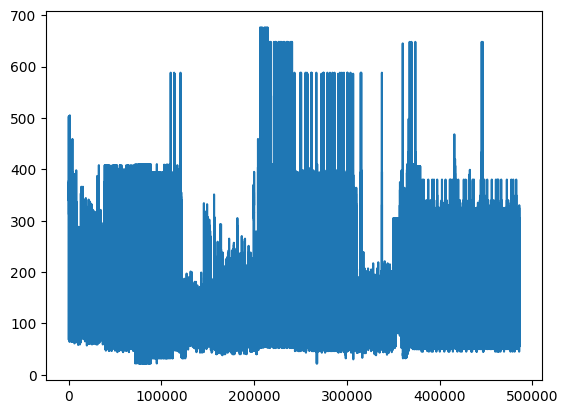

In [32]:
plt.plot(df['CRS_ELAPSED_TIME'])

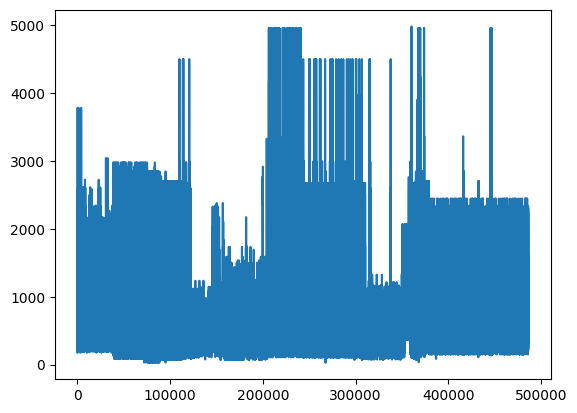

In [33]:
plt.plot(df['DISTANCE'])